# Preliminary analysis of RCA in vivo conditions

In [1]:
import os, sys
import tifffile as tif
import numpy as np
import matplotlib.pyplot as plt
import tqdm
import pandas as pd
import colorcet as cc
import cv2
import skimage
import scipy.ndimage, scipy.stats

In [2]:
from cellpose import models, utils

## Set up directory

In [3]:
data_dir = "/mnt/central_nas/users/ychian/Exp/202503_IMC_inten_encoding/20250426_eGFP_in_vivo_RCA_2nd/20250422_QH_eGFP_RCA_in_vivo_IMC_decov/psf_300_-10db_i7"

# list of all files in the directory
files = os.listdir(data_dir)
files = [os.path.join(data_dir, f) for f in files if f.endswith('.tif')]
files.sort()
files

['/mnt/central_nas/users/ychian/Exp/202503_IMC_inten_encoding/20250426_eGFP_in_vivo_RCA_2nd/20250422_QH_eGFP_RCA_in_vivo_IMC_decov/psf_300_-10db_i7/ROI_002_deconvoluted.tif',
 '/mnt/central_nas/users/ychian/Exp/202503_IMC_inten_encoding/20250426_eGFP_in_vivo_RCA_2nd/20250422_QH_eGFP_RCA_in_vivo_IMC_decov/psf_300_-10db_i7/ROI_004_deconvoluted.tif']

In [4]:
file = files[1]
print(file)
img = tif.imread(file)
img_488 = img[10,:,:]
img_555 = img[9,:,:]

/mnt/central_nas/users/ychian/Exp/202503_IMC_inten_encoding/20250426_eGFP_in_vivo_RCA_2nd/20250422_QH_eGFP_RCA_in_vivo_IMC_decov/psf_300_-10db_i7/ROI_004_deconvoluted.tif


## Exploratory analysis

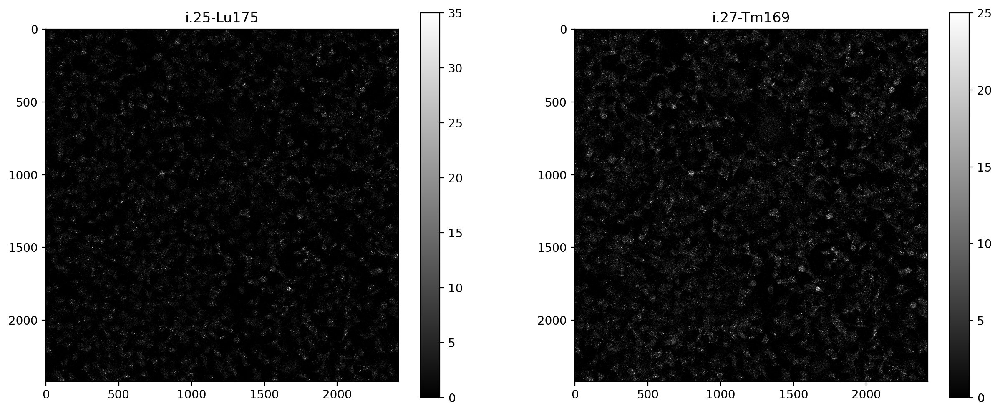

In [5]:
plt.figure(figsize=(15, 6), dpi = 200)
plt.subplot(121)
plt.imshow(img_488, cmap='gray')
plt.clim(np.percentile(img_488, 5), np.percentile(img_488, 99.9))
plt.title("i.25-Lu175")
plt.clim(0, 35)
plt.colorbar()
plt.subplot(122)
plt.imshow(img_555, cmap='gray')
plt.clim(np.percentile(img_555, 5), np.percentile(img_555, 99.9))
plt.title("i.27-Tm169")
plt.clim(0, 25)
plt.colorbar()
plt.show()

Plot a line profile in the diagonal direction

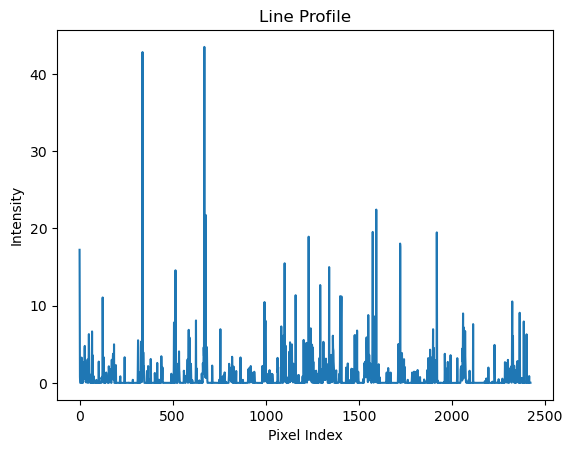

In [6]:
def plot_line_profile(img, start, end):
    # Create a mask for the line
    mask = np.zeros_like(img, dtype=np.uint8)
    cv2.line(mask, start, end, 255, 1)

    # Get the coordinates of the line
    coords = np.column_stack(np.where(mask > 0))

    # Get the pixel values along the line
    line_values = img[coords[:, 0], coords[:, 1]]

    # Plot the line profile
    plt.plot(line_values)
    plt.xlabel('Pixel Index')
    plt.ylabel('Intensity')
    plt.title('Line Profile')
    plt.show()
# Define the start and end points of the line
start = (0, 0)
end = (img_488.shape[1] - 1, img_488.shape[0] - 1)
# Plot the line profile for the first image
plot_line_profile(img_555, start, end)

## Amplicon masking and binarization

Difference of guassian and then local maxima to detect spots

In [7]:
def vis_roll_ball(img, radius):
    # slightly blur the image to remove noise
    img = cv2.GaussianBlur(img, (5, 5), 0)
    # rolling ball algorithm to remove background
    background = skimage.restoration.rolling_ball(img, radius=radius)
    img_sub = img - background
    
    # set figure size
    plt.figure(figsize=(15, 5))
    plt.subplot(131)
    plt.imshow(img, cmap='gray')
    plt.title('Original Image')
    plt.clim(np.percentile(img, 5), np.percentile(img, 99.9))
    plt.axis('off')

    plt.subplot(132)
    plt.imshow(background, cmap='gray')
    plt.title('Background')
    plt.clim(np.percentile(background, 5), np.percentile(background, 99.9))
    plt.axis('off')

    plt.subplot(133)
    plt.imshow(img_sub, cmap='gray')
    plt.title('Subtracted Image')
    plt.clim(np.percentile(img_sub, 5), np.percentile(img_sub, 99.9))
    plt.axis('off')

    plt.show()

    start = (0, 0)
    end = (img_sub.shape[1] - 1, img_sub.shape[0] - 1)
    plot_line_profile(img_sub, start, end)
    
def vis_gaussian(img, sigma1, sigma2):
    # difference of guassian sigma1 = 2, sigma2 = 10
    img_sig1 = skimage.filters.gaussian(img, sigma=sigma1, preserve_range=True)
    img_sig2 = skimage.filters.gaussian(img, sigma=sigma2, preserve_range=True)
    img_sub = img_sig1 - img_sig2
    
    return img_sub

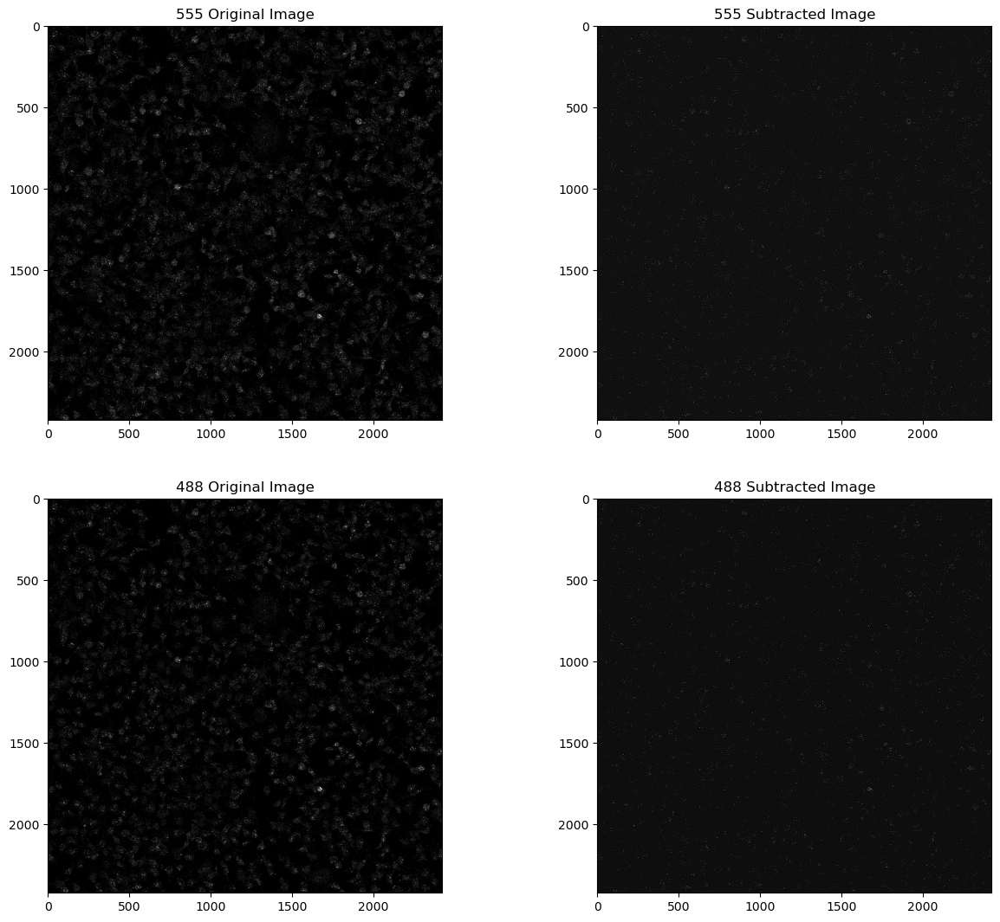

In [8]:
sigma_1 = 0
sigma_2 = 2


img_555_sub = vis_gaussian(img_555, sigma_1, sigma_2)
img_488_sub = vis_gaussian(img_488, sigma_1, sigma_2)

plt.figure(figsize=(15, 13), dpi=100)
plt.subplot(221)
plt.imshow(img_555, cmap='gray')
plt.title('555 Original Image')
plt.clim(np.percentile(img_555, 5), np.percentile(img_555, 99.9))
# plt.axis('off')
plt.subplot(222)
plt.imshow(img_555_sub, cmap='gray')
plt.title('555 Subtracted Image')
plt.clim(np.percentile(img_555_sub, 5), np.percentile(img_555_sub, 99.9))
# plt.axis('off')
plt.subplot(223)
plt.imshow(img_488, cmap='gray')
plt.title('488 Original Image')
plt.clim(np.percentile(img_488, 5), np.percentile(img_488, 99.9))
# plt.axis('off')
plt.subplot(224)
plt.imshow(img_488_sub, cmap='gray')
plt.title('488 Subtracted Image')
plt.clim(np.percentile(img_488_sub, 5), np.percentile(img_488_sub, 99.9))
# plt.axis('off')
plt.show()

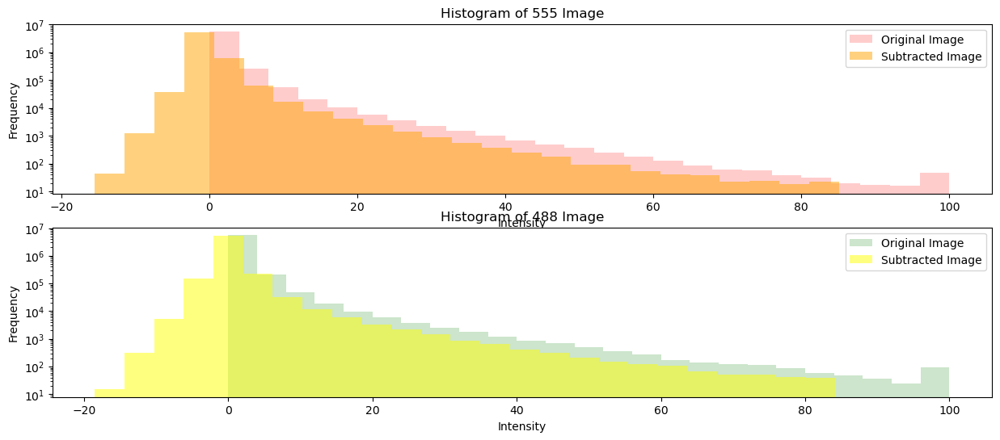

In [9]:

# plot the histogram before and after background subtraction
plt.figure(figsize=(15, 6), dpi=100)
plt.subplot(211)
# plt.hist(img_555_background.flatten(), bins=5, color='gray', alpha=0.5, label='Background Image')
plt.hist(img_555.flatten(), bins=25, color='red', alpha=0.2, label='Original Image')
plt.hist(img_555_sub.flatten(), bins=25, color='orange', alpha=0.5, label='Subtracted Image')
plt.title('Histogram of 555 Image')
plt.xlabel('Intensity')
plt.ylabel('Frequency')
# set y into log
plt.yscale('log')
plt.legend()
plt.subplot(212)
# plt.hist(img_488_background.flatten(), bins=5, color='gray', alpha=0.5, label='Background Image')
plt.hist(img_488.flatten(), bins=25, color='green', alpha=0.2, label='Original Image')
plt.hist(img_488_sub.flatten(), bins=25, color='yellow', alpha=0.5, label='Subtracted Image')
plt.title('Histogram of 488 Image')
plt.xlabel('Intensity')
plt.ylabel('Frequency')
plt.yscale('log')
plt.legend()
plt.show()

Local max (circular kernel)

In [10]:
def maximum_filter(img, radius):
    # set a circular kernel
    kernel = cv2.circle(np.zeros((radius*2+1, radius*2+1), dtype=np.uint8), (radius, radius), radius, 1, -1)
    
    # apply the maximum filter using the circular kernel, consider a reflective border
    img_max = cv2.dilate(img, kernel, iterations=1)
    return img_max

In [11]:
# img_555_max = scipy.ndimage.maximum_filter(img_555_sub, size=5)
# img_555_max = maximum_filter(img_555_sub, radius=0)
img_555_max = maximum_filter(img_555, radius=0)
thres = 20
coordinates = skimage.feature.peak_local_max(img_555_sub, min_distance=1, threshold_abs=thres)

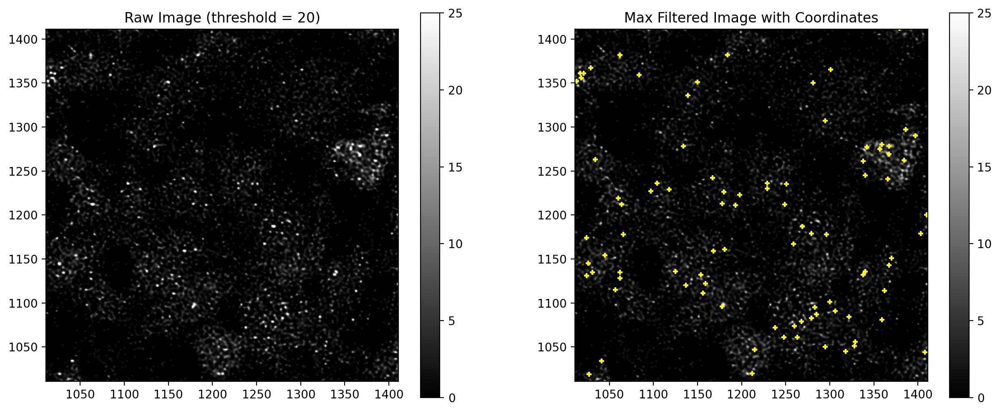

In [13]:

plt.figure(figsize=(15, 6), dpi=200)
plt.subplot(121)
plt.imshow(img_555_max, cmap='gray')
plt.title('Raw Image (threshold = {})'.format(thres))
# plt.clim(np.percentile(img_555_max, 5), np.percentile(img_555_max, 99.9))
plt.clim(0, 25)
plt.xlim(img_555.shape[1]//2-200, img_555.shape[1]//2+200)
plt.ylim(img_555.shape[0]//2-200, img_555.shape[0]//2+200)
plt.colorbar()

plt.subplot(122)
plt.imshow(img_555, cmap='gray')
plt.title('Max Filtered Image with Coordinates')
# plt.clim(np.percentile(img_555, 5), np.percentile(img_555, 99.9))
plt.clim(0, 25)

plt.colorbar()
# overlay the coordinates on the image
for coord in coordinates:
    plt.scatter(coord[1], coord[0], c='yellow', s=20, marker = '+')
    
plt.xlim(img_555.shape[1]//2-200, img_555.shape[1]//2+200)
plt.ylim(img_555.shape[0]//2-200, img_555.shape[0]//2+200)
    
plt.show()

Coarse peak intensity correlation

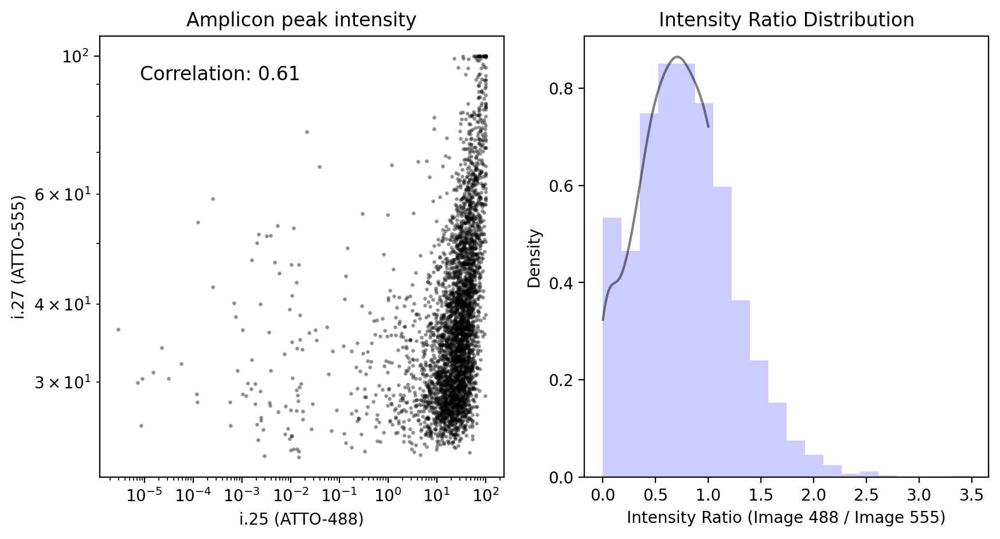

In [14]:
# plot a scatter plot correlating the intensity of img_488 and img_555 in the same coordinates
def plot_scatter(img1, img2, coordinates):
    # Get the pixel values at the coordinates
    values1 = img1[coordinates[:, 0], coordinates[:, 1]]
    values2 = img2[coordinates[:, 0], coordinates[:, 1]]

    # remove data pair if any of them is higher than 60000
    mask = (values1 < 60000) & (values2 < 60000)
    values1 = values1[mask]
    values2 = values2[mask]
    
    # ratio
    ratio = values1/values2
    
    # Plot the scatter plot
    plt.figure(figsize=(10,5), dpi = 200)
    plt.subplot(121)
    plt.scatter(values1, values2, c='black', s=10, alpha=0.3, marker='.')
    plt.xscale('log')
    plt.yscale('log')
    plt.xlabel('i.25 (ATTO-488)')
    plt.ylabel('i.27 (ATTO-555)')
    plt.title('Amplicon peak intensity')
    # compute the correlation coefficient
    correlation = np.corrcoef(values1, values2)[0, 1]
    plt.text(0.1, 0.9, f'Correlation: {correlation:.2f}', transform=plt.gca().transAxes, fontsize=12)
    
    plt.subplot(122)
    # plot a smoothened histogram of the intensity ratio
    plt.hist(ratio, bins=20, color='blue', alpha=0.2, density=True)
    kde = scipy.stats.gaussian_kde(ratio)
    x = np.linspace(0, 1, 100)
    plt.plot(x, kde(x), color='black', alpha=0.5)
    plt.xlabel('Intensity Ratio (Image 488 / Image 555)')
    plt.ylabel('Density')
    plt.title('Intensity Ratio Distribution')
    
    plt.show()
    
    
    
# Convert coordinates to a numpy array
coordinates = np.array(coordinates)
# Plot the scatter plot
plot_scatter(img_488, img_555, coordinates)

whole-amplicon intensity correlation

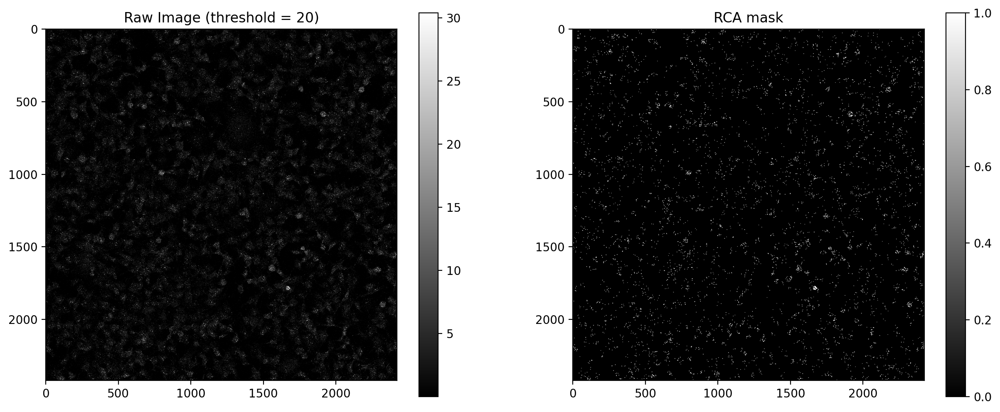

In [15]:
img_mask = img_555_max > thres
# dilate the mask
kernel = np.ones((3, 3), np.uint8)
img_mask = cv2.dilate(img_mask.astype(np.uint8), kernel, iterations=1)

plt.figure(figsize=(15, 6), dpi=200)
plt.subplot(121)
plt.imshow(img_555_max, cmap='gray')
plt.title('Raw Image (threshold = {})'.format(thres))
plt.clim(np.percentile(img_555_max, 5), np.percentile(img_555_max, 99.9))
# plt.xlim(500, 1000)
# plt.ylim(2000, 1500)
plt.colorbar()

plt.subplot(122)
plt.imshow(img_mask, cmap='gray')
plt.title('RCA mask')
plt.clim(0, 1)
# plt.xlim(1000, 1250)
# plt.ylim(1000, 1250)
plt.colorbar()

plt.show()

In [16]:
# turn the mask into a label image
img_mask = skimage.measure.label(img_mask)
img_488_df = skimage.measure.regionprops_table(img_mask, img_488, properties=['label', 'centroid', 'area', 'mean_intensity'])
img_555_df = skimage.measure.regionprops_table(img_mask, img_555, properties=['label', 'centroid', 'area', 'mean_intensity'])

In [17]:
img_488_df = pd.DataFrame(img_488_df)
img_555_df = pd.DataFrame(img_555_df)

# add one column to store area*mean_intensity as total_intensity
img_488_df['total_intensity'] = img_488_df['area'] * img_488_df['mean_intensity']
img_555_df['total_intensity'] = img_555_df['area'] * img_555_df['mean_intensity']

# merge the two dataframes on label, keep area, centroid-0, centroid-1 only from img_488_df, the rest add the suffixes
amp_df = pd.merge(img_488_df, img_555_df, on='label', suffixes=('_488', '_555'))

amp_df.rename(columns={'area_488': 'area', 'centroid-0_488': 'centroid-0', 'centroid-1_488': 'centroid-1'}, inplace=True)
amp_df.drop(columns=['area_555', 'centroid-0_555', 'centroid-1_555'], inplace=True)

# change the column name "centroid-0" to "y"
amp_df.rename(columns={'centroid-0': 'y'}, inplace=True)
# change the column name "centroid-1" to "x"
amp_df.rename(columns={'centroid-1': 'x'}, inplace=True)

amp_df

,label,y,x,area,mean_intensity_488,total_intensity_488,mean_intensity_555,total_intensity_555
0,1,0.5,530.5,8.0,7.064061,56.512488,15.725464,125.803709
1,2,1.0,565.0,9.0,8.324575,74.921172,12.009528,108.085749
2,3,0.5,581.0,6.0,6.116917,36.701499,14.254501,85.527003
3,4,1.6,749.6,15.0,4.850283,72.754248,11.183455,167.751819
4,5,0.5,763.0,6.0,16.005452,96.032714,9.638517,57.831103
...,...,...,...,...,...,...,...,...
5337,5338,2416.0,1937.0,9.0,13.846004,124.614035,12.523595,112.712351
5338,5339,2418.0,1819.0,15.0,11.642455,174.636824,15.255762,228.836427
5339,5340,2420.0,2098.0,9.0,6.404643,57.641791,10.475859,94.282731
5340,5341,2420.5,1462.0,6.0,0.012035,0.072210,12.424645,74.547868


In [ ]:
# save dataframe to csv
output_dir = os.path.join(data_dir, 'dataframes')
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
amp_df.to_csv(os.path.join(output_dir, 'RCA_df_'+os.path.basename(file)[:-4]+'.csv'), index=False)

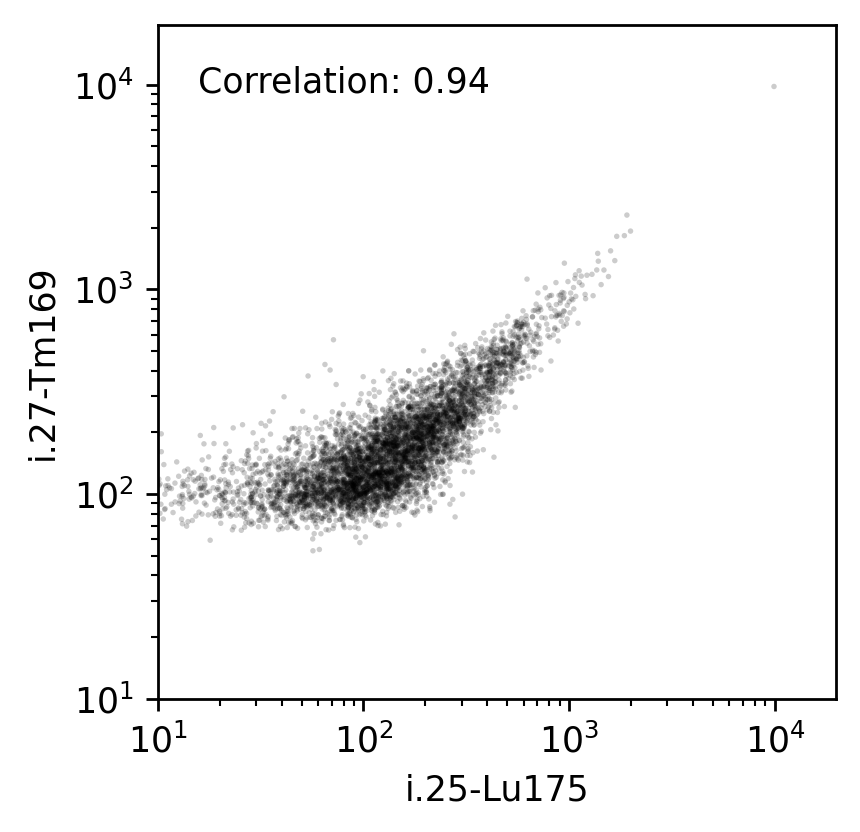

Mean ratio:  0.8424658893078575
Median ratio:  0.8347171045217665


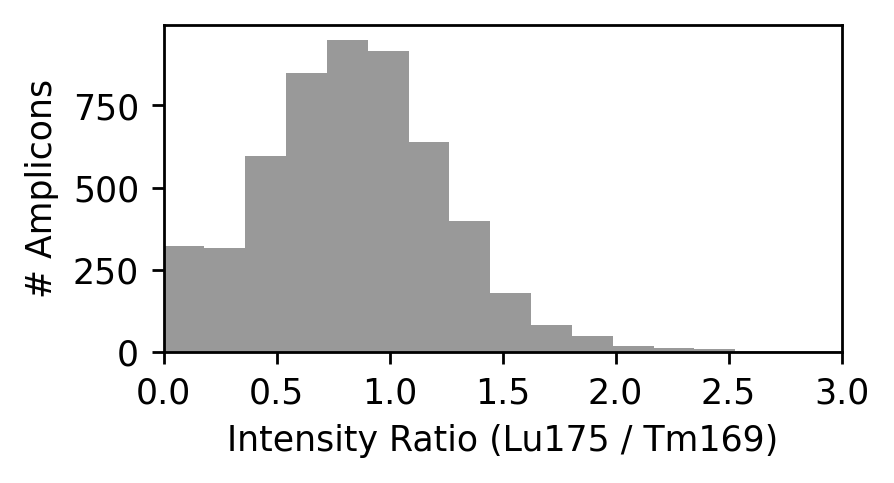

In [19]:
# plot scatter plot of total intensity
plt.figure(figsize=(3.5,3.5), dpi = 250)
plt.scatter(amp_df['total_intensity_488'], amp_df['total_intensity_555'], c='black', s=10, alpha=0.2, marker='.', edgecolors='none')
plt.xlabel('i.25-Lu175')
plt.ylabel('i.27-Tm169')
# plt.title('Amplicon total intensity')
# compute the correlation coefficient
correlation = np.corrcoef(amp_df['total_intensity_488'], amp_df['total_intensity_555'])[0, 1]
plt.text(0.06, 0.9, f'Correlation: {correlation:.2f}', transform=plt.gca().transAxes, fontsize=10)
plt.xlim(10, 2*np.max(amp_df['total_intensity_488']))
plt.ylim(10, 2*np.max(amp_df['total_intensity_555']))
# turn on log scale
plt.xscale('log')
plt.yscale('log')
plt.show()

# print the mean and median of the intensity ratio
mean_ratio = np.mean(amp_df['total_intensity_488']/amp_df['total_intensity_555'])
median_ratio = np.median(amp_df['total_intensity_488']/amp_df['total_intensity_555'])
print('Mean ratio: ', mean_ratio)
print('Median ratio: ', median_ratio)
plt.figure(figsize=(3.5,1.7), dpi = 250)
# plot a smoothened histogram of the intensity ratio
plt.hist(amp_df['total_intensity_488']/amp_df['total_intensity_555'], bins=20,  color='gray', alpha=0.8, density=False)
kde = scipy.stats.gaussian_kde(amp_df['total_intensity_488']/amp_df['total_intensity_555'])
# x = np.linspace(0, 1, 100)
# plt.plot(x, kde(x), color='black', alpha=0.5)
plt.xlim(0,3)
plt.xlabel('Intensity Ratio (Lu175 / Tm169)')
plt.ylabel('# Amplicons')
# plt.title('Intensity Ratio Distribution')
plt.show()

In [20]:
voxel_size = 0.33

Mean diameter:  1397.8776566476101
Median diameter:  1289.9106314237088


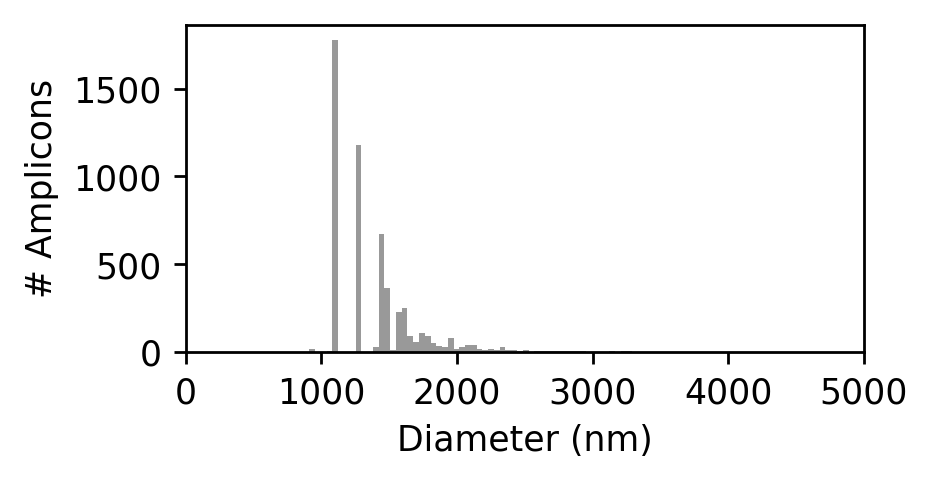

In [21]:
plt.figure(figsize=(3.5, 1.7), dpi=250)
# plot a histogram of the area for each amplicon
# plt.subplot(122)
diameter = np.sqrt(amp_df['area']/np.pi) * 2 * voxel_size * 1000
print('Mean diameter: ', np.mean(diameter))
print('Median diameter: ', np.median(diameter))
plt.hist(diameter, bins='auto', color='gray', alpha=0.8, label='Amplicon diameter', density=False)
plt.xlim(0, 5000)
# plt.ylim(0, 200)
# plt.title('Amplicon Diameter')

plt.xlabel('Diameter (nm)')
plt.ylabel('# Amplicons')

# set subplot distance
# plt.tight_layout(pad=3.0)
plt.show()


### Compute SNR

Define SNR as mean intensity / std(background)

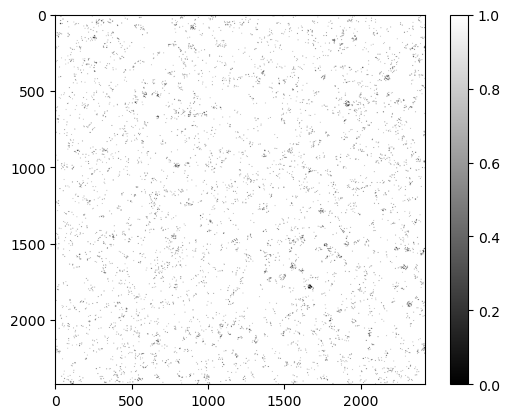

In [22]:
# find the background by inverting the mask
img_mask_bin = img_mask.copy()
img_mask_bin[img_mask_bin > 0] = 1
img_mask_inv = np.invert(img_mask_bin)
# normalize the mask to 0-1
img_mask_inv = (img_mask_inv-img_mask_inv.min())/np.abs(img_mask_inv.max()-img_mask_inv.min())
plt.imshow(img_mask_inv, cmap='gray')
plt.clim(0, 1)
plt.colorbar()
plt.show()

In [23]:
# compute the standard deviation of the background
background_std_555 = np.std(img_555[img_mask_inv > 0])
background_mean_555 = np.mean(img_555[img_mask_inv > 0])
background_std_488 = np.std(img_488[img_mask_inv > 0])
background_mean_488 = np.mean(img_488[img_mask_inv > 0])
print(f"Background mean: {background_mean_555:.2f}, std: {background_std_555:.2f}")
print(f"Background mean: {background_mean_488:.2f}, std: {background_std_488:.2f}")
# add a column to the amp_df for the SNR
amp_df['SNR_555'] = 0
amp_df['SNR_488'] = 0

# compute the SNR for each amplicon
for label in amp_df['label'].tolist():
    # compute the mean intensity of the amplicon
    peak_intensity_555 = img_555[amp_df.loc[amp_df['label'] == label]['y'].astype(int), amp_df.loc[amp_df['label'] == label]['x'].astype(int)]
    peak_intensity_488 = img_488[amp_df.loc[amp_df['label'] == label]['y'].astype(int), amp_df.loc[amp_df['label'] == label]['x'].astype(int)]
    # compute the SNR
    snr_555 = (np.mean(peak_intensity_555) - background_mean_555) / background_std_555
    snr_488 = (np.mean(peak_intensity_488) - background_mean_488) / background_std_488
    # add the SNR to the amp_df
    amp_df.loc[amp_df['label'] == label, 'SNR_555'] = snr_555
    amp_df.loc[amp_df['label'] == label, 'SNR_488'] = snr_488

Background mean: 0.82, std: 1.65
Background mean: 0.73, std: 1.75


/tmp/ipykernel_394049/3779260486.py:21: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '15.013926804957691' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  amp_df.loc[amp_df['label'] == label, 'SNR_555'] = snr_555
/tmp/ipykernel_394049/3779260486.py:22: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '5.613029796812354' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  amp_df.loc[amp_df['label'] == label, 'SNR_488'] = snr_488


In [24]:
amp_df

,label,y,x,area,mean_intensity_488,total_intensity_488,mean_intensity_555,total_intensity_555,SNR_555,SNR_488
0,1,0.5,530.5,8.0,7.064061,56.512488,15.725464,125.803709,15.013927,5.613030
1,2,1.0,565.0,9.0,8.324575,74.921172,12.009528,108.085749,11.739504,6.544802
2,3,0.5,581.0,6.0,6.116917,36.701499,14.254501,85.527003,14.543518,2.779204
3,4,1.6,749.6,15.0,4.850283,72.754248,11.183455,167.751819,10.237840,2.776286
4,5,0.5,763.0,6.0,16.005452,96.032714,9.638517,57.831103,12.279891,18.046411
...,...,...,...,...,...,...,...,...,...,...
5337,5338,2416.0,1937.0,9.0,13.846004,124.614035,12.523595,112.712351,15.102031,13.358625
5338,5339,2418.0,1819.0,15.0,11.642455,174.636824,15.255762,228.836427,23.654501,15.144469
5339,5340,2420.0,2098.0,9.0,6.404643,57.641791,10.475859,94.282731,13.763365,6.353919
5340,5341,2420.5,1462.0,6.0,0.012035,0.072210,12.424645,74.547868,4.318311,-0.414336


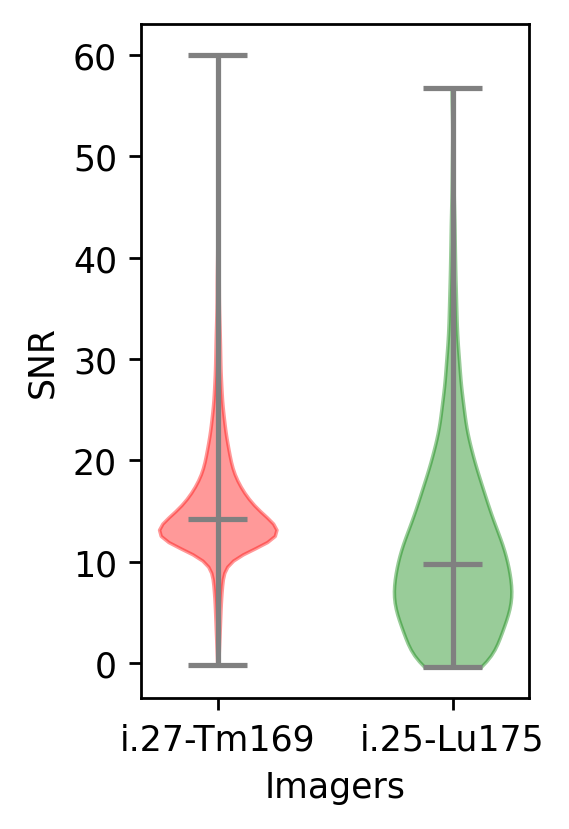

In [25]:
fig, ax = plt.subplots(1,1, figsize=(2., 3.5), dpi=250)
plots = ax.violinplot([amp_df['SNR_555'], amp_df['SNR_488']], showmeans=False, showmedians=True, showextrema=True)
colors = ['red', 'green']
for pc, color in zip(plots['bodies'], colors):
    pc.set_facecolor(color)
    pc.set_edgecolor(color)
    pc.set_alpha(0.4)
    
# set the color of lines
lw = 1.5
plots['cmedians'].set_edgecolor('gray')
plots['cmedians'].set_linewidth(lw)
plots['cmaxes'].set_edgecolor('gray')
plots['cmaxes'].set_linewidth(lw)
plots['cmins'].set_edgecolor('gray')
plots['cmins'].set_linewidth(lw)
plots['cbars'].set_edgecolor('gray')
plots['cbars'].set_linewidth(lw)

# set x tickes
plt.xticks([1, 2], ['i.27-Tm169', 'i.25-Lu175'])
plt.xlabel('Imagers')
plt.ylabel('SNR')
plt.show()

In [26]:
# save the dataframes to csv
df_dir = os.path.join(data_dir, "dataframes")
if not os.path.exists(df_dir):
    os.makedirs(df_dir)
amp_df.to_csv(os.path.join(df_dir, os.path.basename(file).replace('.tif', '_amp_df.csv')), index=False)

## Nuclear segmentation and visualization

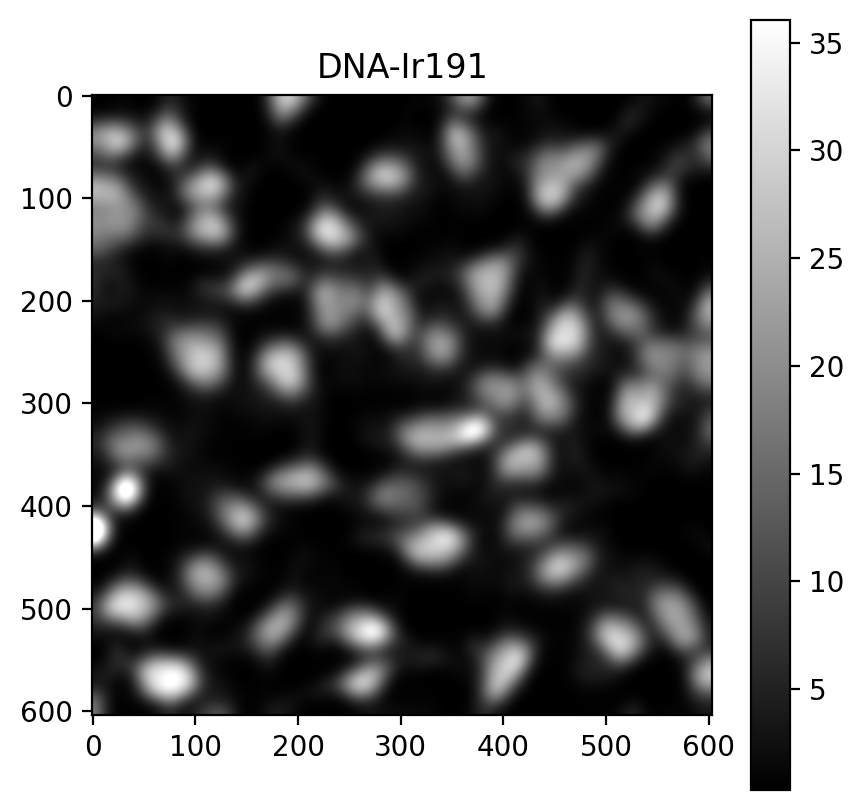

In [26]:
img_nuc = img[11,:,:]

# blur the img_nuc
img_nuc = cv2.GaussianBlur(img_nuc, (0, 0), 8)

plt.figure(figsize=(5,5), dpi=200)
plt.imshow(img_nuc, cmap='gray')
plt.clim(np.percentile(img_nuc, 5), np.percentile(img_nuc, 99.9))
plt.title("DNA-Ir191")
plt.colorbar()
plt.show()


In [27]:
model_nuc = models.Cellpose(model_type="nuclei")

In [28]:
channels = [[0, 0]]

nmasks, nflows, nstyles, ndiams = model_nuc.eval(img_nuc, diameter=None, channels = channels)

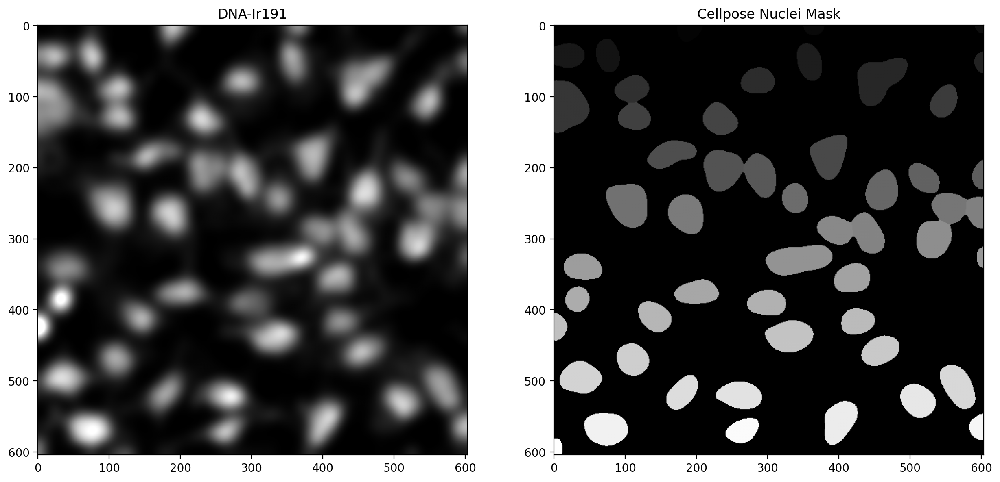

In [29]:
# show the masks
plt.figure(figsize=(15, 15), dpi = 200)

plt.subplot(121)
plt.imshow(img_nuc, cmap='gray')
plt.clim(np.percentile(img_nuc, 5), np.percentile(img_nuc, 99.9))
plt.title("DNA-Ir191")

plt.subplot(122)
plt.imshow(nmasks, cmap='gray')
plt.title("Cellpose Nuclei Mask")
plt.show()

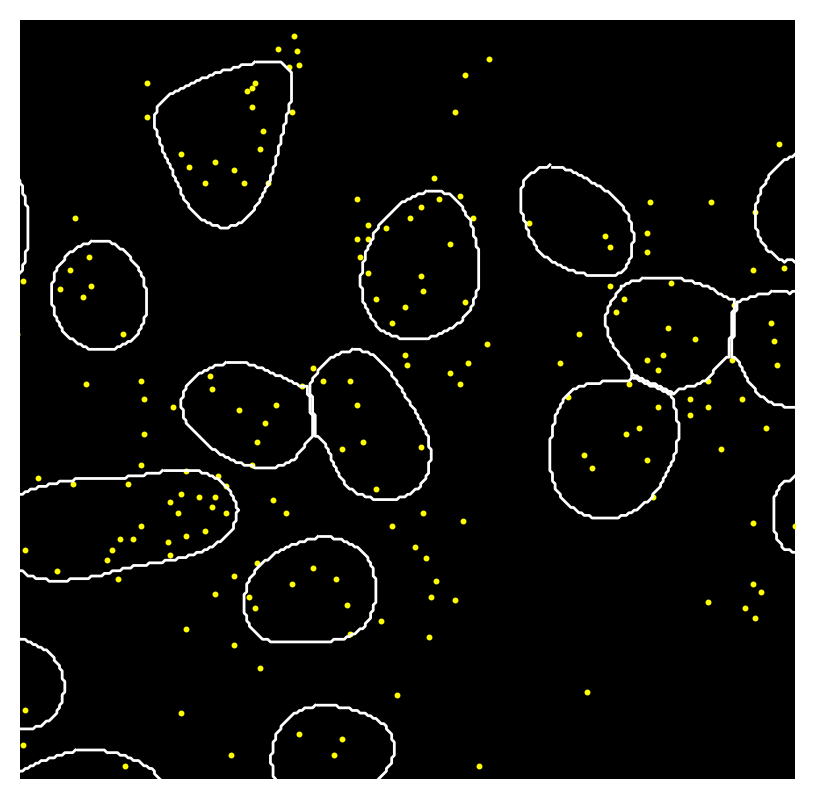

In [30]:
# convert the mask to a contour
bmask_contour = utils.outlines_list(nmasks)

# plot the contour of cmask and bmask on the same image
plt.figure(figsize=(5, 5), dpi=200)
psudo_img = np.zeros_like(img_555)
plt.imshow(psudo_img, cmap='gray', clim=(0, 1))
# plt.imshow(img_555, cmap=cc.cm.fire, clim=(500, 2000))
# add contour of cmask
lw=1
# add contour of bmask
for contour in bmask_contour:
    plt.plot(contour[:, 0], contour[:, 1], color='white', linewidth=lw)
for coord in coordinates:
    plt.scatter(coord[1], coord[0], c='yellow', s=5, marker = '.')
# set black background
plt.axis('off')
plt.xlim(308, 308+98*3)
plt.ylim(132+98*3, 138)
plt.show()


## Cellular and nuclear segmentation

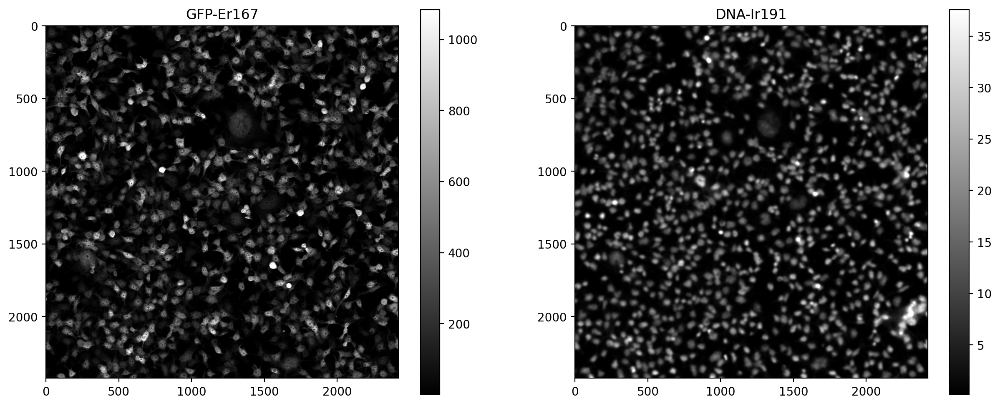

In [27]:
img_nuc = img[11,:,:]
img_cyto = img[8,:,:]

# blur the img_nuc
img_nuc = cv2.GaussianBlur(img_nuc, (0, 0), 6)
img_cyto = cv2.GaussianBlur(img_cyto, (0, 0), 1)

plt.figure(figsize=(15, 6), dpi = 200)
plt.subplot(121)
plt.imshow(img_cyto, cmap='gray')
plt.clim(np.percentile(img_cyto, 5), np.percentile(img_cyto, 99.9))
plt.title("GFP-Er167")
plt.colorbar()

plt.subplot(122)
plt.imshow(img_nuc, cmap='gray')
plt.clim(np.percentile(img_nuc, 5), np.percentile(img_nuc, 99.9))
plt.title("DNA-Ir191")
plt.colorbar()
plt.show()


In [28]:
model_cyto = models.Cellpose(model_type="cyto3")
model_nuc = models.Cellpose(model_type="nuclei")

In [29]:
channels = [[0, 0]]

cmasks, cflows, cstyles, cdiams = model_cyto.eval(img_cyto, diameter=None, channels = channels)
nmasks, nflows, nstyles, ndiams = model_nuc.eval(img_nuc, diameter=None, channels = channels)

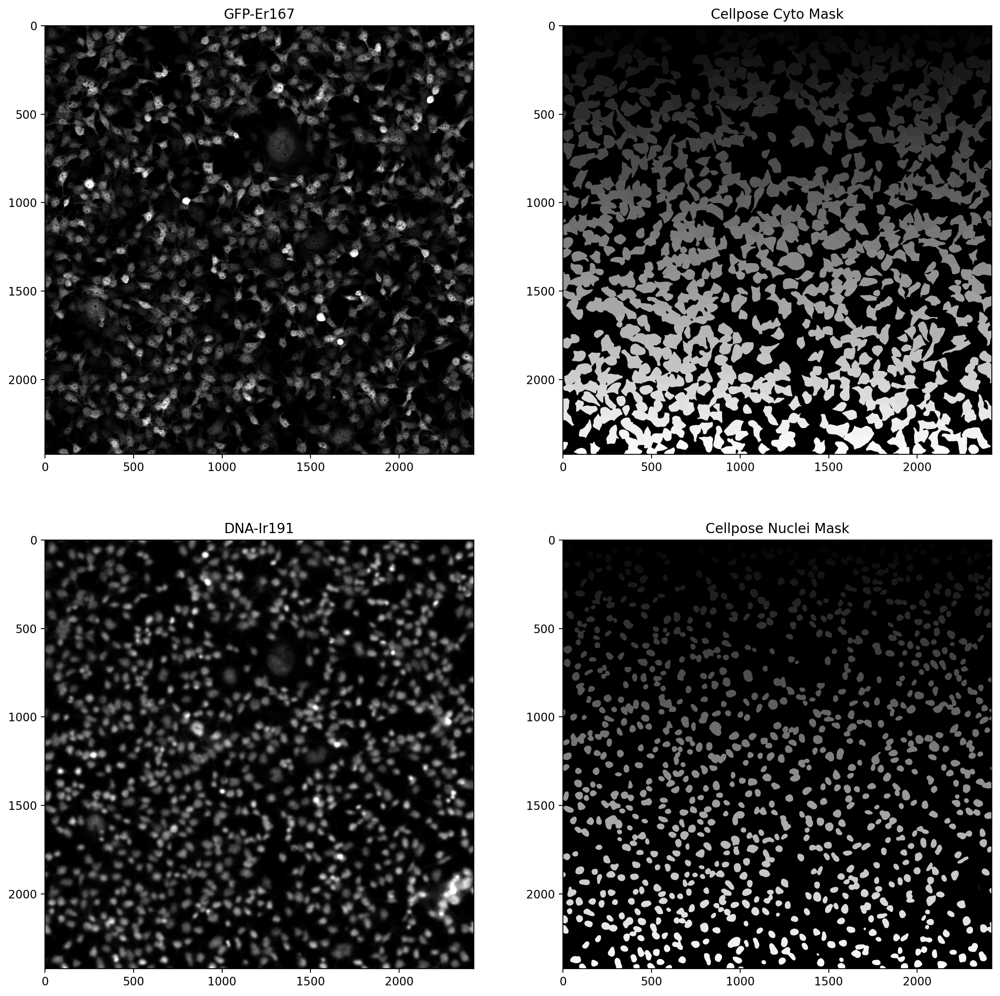

In [30]:
# show the masks
plt.figure(figsize=(15, 15), dpi = 200)
plt.subplot(221)
plt.imshow(img_cyto, cmap='gray')
plt.clim(np.percentile(img_cyto, 5), np.percentile(img_cyto, 99.9))
plt.title("GFP-Er167")

plt.subplot(222)
plt.imshow(cmasks, cmap='gray')
plt.title("Cellpose Cyto Mask")

plt.subplot(223)
plt.imshow(img_nuc, cmap='gray')
plt.clim(np.percentile(img_nuc, 5), np.percentile(img_nuc, 99.9))
plt.title("DNA-Ir191")

plt.subplot(224)
plt.imshow(nmasks, cmap='gray')
plt.title("Cellpose Nuclei Mask")
plt.show()

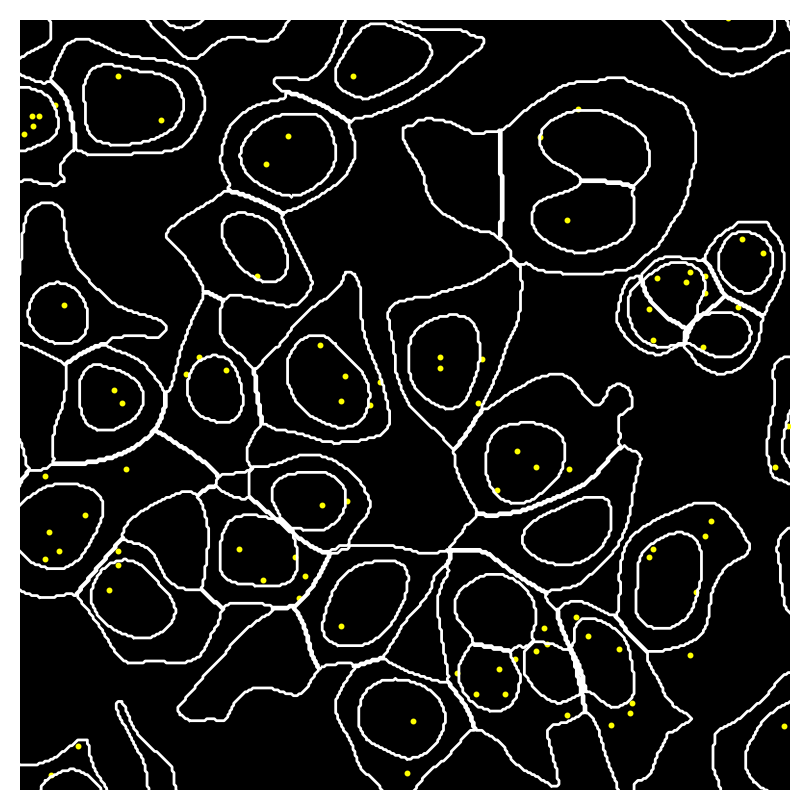

In [31]:
# convert the mask to a contour
cmask_contour = utils.outlines_list(cmasks)
bmask_contour = utils.outlines_list(nmasks)

# plot the contour of cmask and bmask on the same image
plt.figure(figsize=(5, 5), dpi=200)
psudo_img = np.zeros_like(img_555)
plt.imshow(psudo_img, cmap='gray', clim=(0, 1))
# plt.imshow(img_555, cmap=cc.cm.fire, clim=(500, 2000))
# add contour of cmask
lw=1
for contour in cmask_contour:
    plt.plot(contour[:, 0], contour[:, 1], color='white', linewidth=lw)
# add contour of bmask
for contour in bmask_contour:
    plt.plot(contour[:, 0], contour[:, 1], color='white', linewidth=lw)
for coord in coordinates:
    plt.scatter(coord[1], coord[0], c='yellow', s=5, marker = '.')
# set black background
plt.axis('off')
plt.xlim(img_555.shape[1]//2-200, img_555.shape[1]//2+200)
plt.ylim(img_555.shape[0]//2-200, img_555.shape[0]//2+200)

plt.show()


In [32]:
# generate a df for the cellpose mask
cyto_df = skimage.measure.regionprops_table(cmasks, img_488, properties=['label', 'centroid', 'area', 'mean_intensity'])
cyto_df = pd.DataFrame(cyto_df)

cyto_df['total_intensity'] = cyto_df['area'] * cyto_df['mean_intensity']

# change the column name "centroid-0" to "y"
cyto_df.rename(columns={'centroid-0': 'y'}, inplace=True)
# change the column name "centroid-1" to "x"
cyto_df.rename(columns={'centroid-1': 'x'}, inplace=True)

cyto_df

,label,y,x,area,mean_intensity,total_intensity
0,1,13.339321,107.450100,2004.0,0.868465,1740.404278
1,2,5.409836,236.827869,366.0,1.564695,572.678544
2,3,46.739114,374.518483,5167.0,1.266399,6543.484371
3,4,9.457244,559.535689,1415.0,2.478077,3506.478990
4,5,7.543084,749.641723,882.0,1.334567,1177.088236
...,...,...,...,...,...,...
933,934,2406.147812,1567.381537,1874.0,2.914354,5461.499139
934,935,2405.207557,101.691511,1932.0,3.567043,6891.527184
935,936,2409.335968,1802.044466,1012.0,2.006428,2030.505320
936,937,2411.013942,366.399240,789.0,0.778541,614.268823


## Cell-dependent amplicon analysis

In [33]:
# for each mask (with label) in the cellpose mask, find the corresponding RCA mask, add the "amplicon_count" column to the cyto_df, add the "cyto_label" column to the amp_df
cyto_df['amplicon_count'] = 0
amp_df['cyto_label'] = 0

for i in range(len(cyto_df)):
    # get the label of the cellpose mask
    label = cyto_df['label'][i]
    amp_count = 0
    for j in range(len(amp_df)):
        amp_x = amp_df['x'][j].astype(int)
        amp_y = amp_df['y'][j].astype(int)
        amp_label = cmasks[amp_y, amp_x]
        if amp_label == label:
            amp_count += 1
            amp_df.loc[j, 'cyto_label'] = label
    cyto_df.loc[i, 'amplicon_count'] = amp_count
cyto_df['amplicon_count'] = cyto_df['amplicon_count'].astype(int)
amp_df['cyto_label'] = amp_df['cyto_label'].astype(int)

In [34]:
cyto_df

,label,y,x,area,mean_intensity,total_intensity,amplicon_count
0,1,13.339321,107.450100,2004.0,0.868465,1740.404278,2
1,2,5.409836,236.827869,366.0,1.564695,572.678544,2
2,3,46.739114,374.518483,5167.0,1.266399,6543.484371,7
3,4,9.457244,559.535689,1415.0,2.478077,3506.478990,9
4,5,7.543084,749.641723,882.0,1.334567,1177.088236,2
...,...,...,...,...,...,...,...
933,934,2406.147812,1567.381537,1874.0,2.914354,5461.499139,6
934,935,2405.207557,101.691511,1932.0,3.567043,6891.527184,6
935,936,2409.335968,1802.044466,1012.0,2.006428,2030.505320,1
936,937,2411.013942,366.399240,789.0,0.778541,614.268823,1


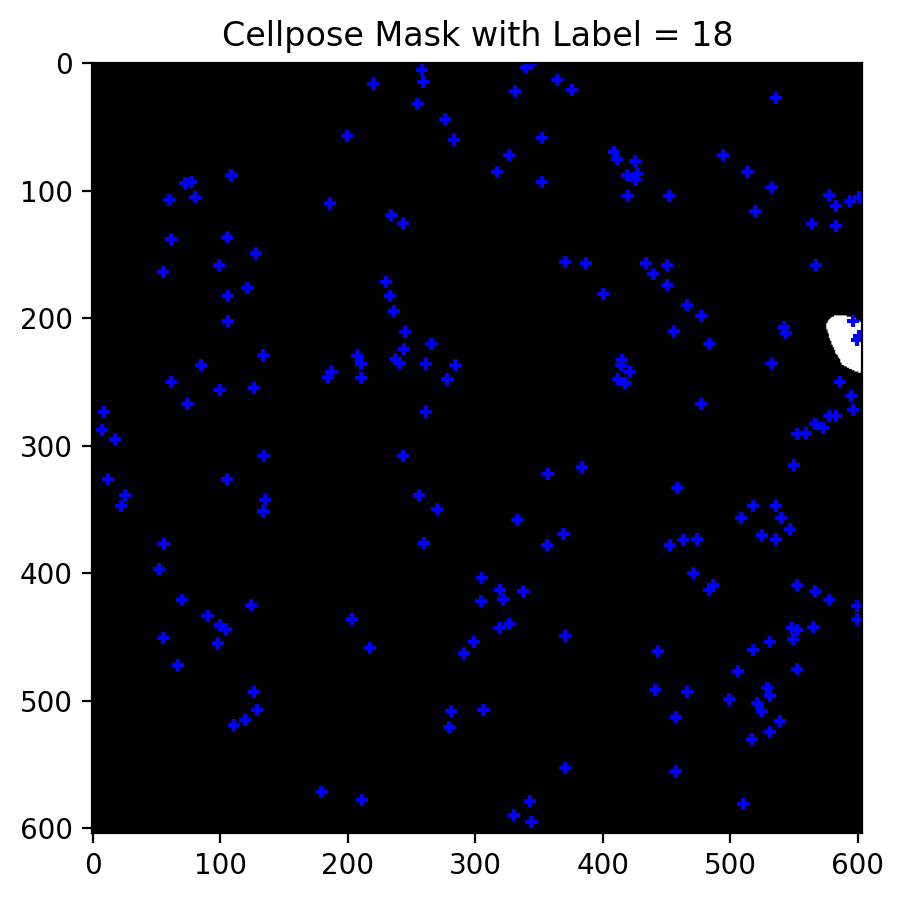

In [36]:
# show mask with label = 18
plt.figure(figsize=(5, 5), dpi=200)
plt.imshow(cmasks == 18, cmap='gray')
plt.title('Cellpose Mask with Label = 18')
plt.clim(0, 1)

for coord in coordinates:
    plt.scatter(coord[1], coord[0], c='blue', s=20, marker = '+')

plt.show()

In [35]:
# compute the proportion of amplicons with label = 0 and > 0
total_amplicons = len(amp_df)
cyto_amplicons  = cyto_df['amplicon_count'].sum()

proportion_cyto = cyto_amplicons / total_amplicons

print(f"Amplicons within cytoplasm: {cyto_amplicons} / {total_amplicons} = {proportion_cyto:.2f}")


Amplicons within cytoplasm: 4751 / 5342 = 0.89


Boxplot of how amplicon count distribution looks like

Median amplicon count: 5.0
Mean amplicon count: 5.065031982942431


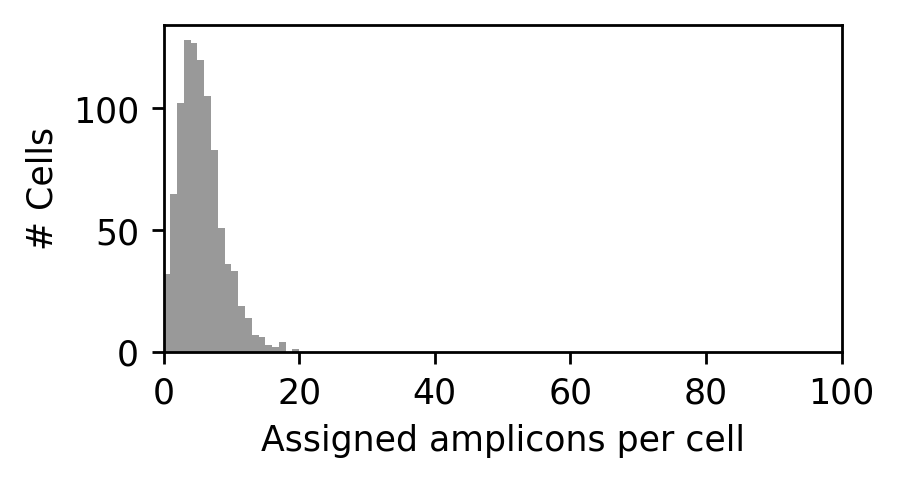

Median diameter: 1289.9106314237088
Mean diameter: 1397.8776566476101


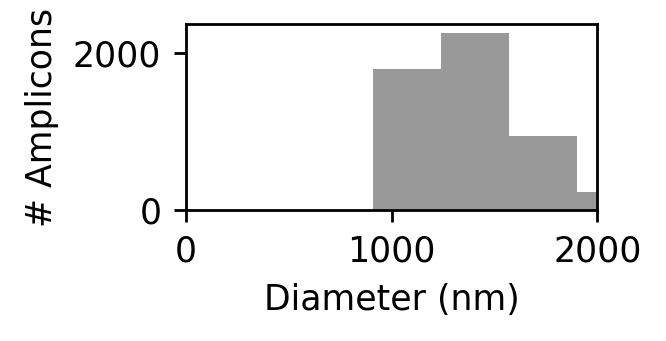

In [39]:
# plot a histogram of the amplicon count for each cellpose label
# print median and mean of the amplicon count
print(f"Median amplicon count: {cyto_df['amplicon_count'].median()}")
print(f"Mean amplicon count: {cyto_df['amplicon_count'].mean()}")

plt.figure(figsize=(3.5,1.7), dpi=250)
# plt.subplot(121)
plt.hist(cyto_df['amplicon_count'], bins=20, color='gray', alpha=0.8, label='Amplicon Count per Cell', density=False)
# plt.title('Amplicon Count per Cell')
plt.xlim(0, 100)
# plt.ylim(0, 20)
plt.xlabel('Assigned amplicons per cell')
plt.ylabel('# Cells')

plt.show()


plt.figure(figsize=(3.3,2), dpi=250)
# plt.subplot(122)
voxel_size = 0.33
diameter = np.sqrt(amp_df['area']/np.pi) * 2 * voxel_size * 1000
# print the median and mean of diameter
print(f"Median diameter: {diameter.median()}")
print(f"Mean diameter: {diameter.mean()}")
plt.hist(diameter, bins=20, color='gray', alpha=0.8, label='Amplicon diameter', density=False)
plt.xlim(0, 2000)
# plt.ylim(0, 150)
# plt.title('Amplicon Diameter')

plt.xlabel('Diameter (nm)')
plt.ylabel('# Amplicons')

# set subplot distance
plt.tight_layout(pad=3.0)
plt.show()


Compute the pair-wise distance of amplicons

In [40]:
voxel_size = 0.33

def get_amplicon_distance(x1, y1, x2, y2, voxel_size):
    # calculate the distance between two points
    return np.sqrt((x1 - x2)**2 + (y1 - y2)**2) * voxel_size * 1000

# compute pairwise distance between all amplicons and plot a histogram
def compute_pairwise_distance(df, voxel_size):
    distances = []
    for i in range(len(df)):
        for j in range(i+1, len(df)):
            if df['cyto_label'][i] == df['cyto_label'][j]:
                # only compute distance for amplicons with the same cell label
                # skip if the amplicon is not in the cell
                if df['cyto_label'][i] == 0 or df['cyto_label'][j] == 0:
                    continue
                x1, y1 = df['x'][i], df['y'][i]
                x2, y2 = df['x'][j], df['y'][j]
                distance = get_amplicon_distance(x1, y1, x2, y2, voxel_size)
                distances.append(distance)
    return distances

# compute pairwise distance for all amplicons
distances = compute_pairwise_distance(amp_df, voxel_size)


Median pairwise distance: 7702.282803676617
Mean pairwise distance: 8670.38068244805
1330.2725284692608


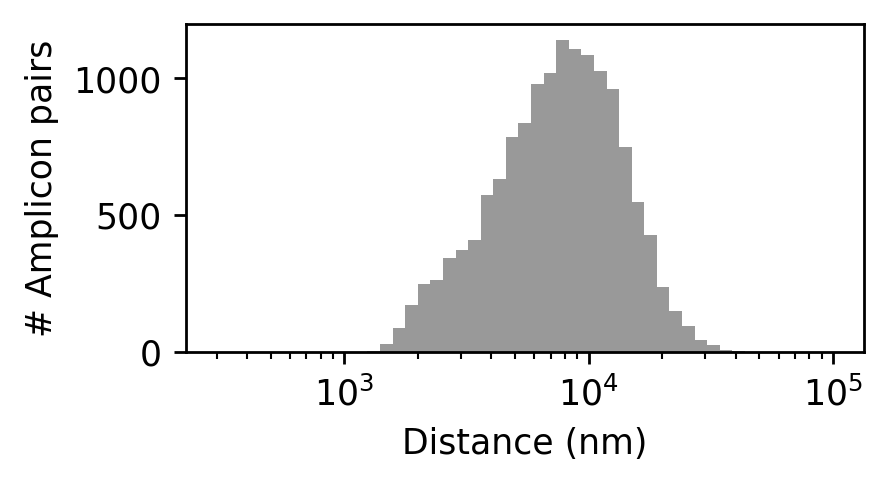

In [41]:
# print the median and mean of the pairwise distance
print(f"Median pairwise distance: {np.median(distances)}")
print(f"Mean pairwise distance: {np.mean(distances)}")
print(np.min(distances))

plt.figure(figsize=(3.5,1.7), dpi=250)
# plot a histogram of the pairwise distance, use binning that match the log10 scale
plt.hist(distances, bins=np.logspace(np.log10(300), np.log10(100000), 50), color='gray', alpha=0.8, label='Pairwise distance', density=False)
plt.xlabel('Distance (nm)')
plt.ylabel('# Amplicon pairs')
plt.xscale('log')
plt.show()

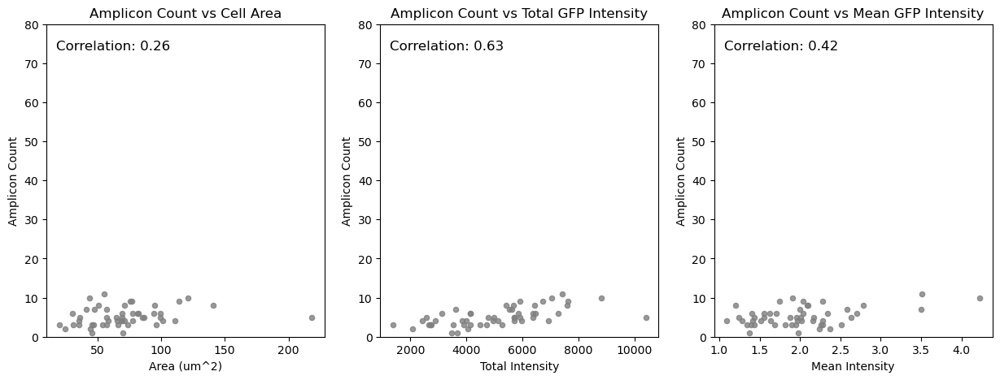

In [39]:
# remove those with amplicon count = 0
cyto_df_filtered = cyto_df[cyto_df['amplicon_count'] > 0]

# plot a scatter plot of amplicon count vs area
plt.figure(figsize=(15, 5), dpi=100)
plt.subplot(131)
plt.scatter(cyto_df_filtered['area'] * voxel_size**2, cyto_df_filtered['amplicon_count'], c='gray', alpha=0.8, s=20)
# add correlation value
corr = np.corrcoef(cyto_df_filtered['area'] * voxel_size**2, cyto_df_filtered['amplicon_count'])[0, 1]
plt.text(0.24, 0.93, f'Correlation: {corr:.2f}', fontsize=12, ha='center', va='center', transform=plt.gca().transAxes)
plt.ylim(0, 80)
plt.title('Amplicon Count vs Cell Area')
plt.xlabel('Area (um^2)')
plt.ylabel('Amplicon Count')

plt.subplot(132)
plt.scatter(cyto_df_filtered['total_intensity'], cyto_df_filtered['amplicon_count'], c='gray', alpha=0.8, s=20)
# add correlation value
corr = np.corrcoef(cyto_df_filtered['total_intensity'], cyto_df_filtered['amplicon_count'])[0, 1]
plt.text(0.24, 0.93, f'Correlation: {corr:.2f}', fontsize=12, ha='center', va='center', transform=plt.gca().transAxes)
plt.ylim(0, 80)
plt.title('Amplicon Count vs Total GFP Intensity')
plt.xlabel('Total Intensity')
plt.ylabel('Amplicon Count')

# plot a scatter plot of amplicon count vs mean intensity
plt.subplot(133)
plt.scatter(cyto_df_filtered['mean_intensity'], cyto_df_filtered['amplicon_count'], c='gray', alpha=0.8, s=20)
# add correlation value
corr = np.corrcoef(cyto_df_filtered['mean_intensity'], cyto_df_filtered['amplicon_count'])[0, 1]
plt.text(0.24, 0.93, f'Correlation: {corr:.2f}', fontsize=12, ha='center', va='center', transform=plt.gca().transAxes)
plt.ylim(0, 80)
plt.title('Amplicon Count vs Mean GFP Intensity')
plt.xlabel('Mean Intensity')
plt.ylabel('Amplicon Count')
plt.show()

###  Intensity ratio distribution per cell

Filter the amplicons of which the cell have less than 10 replicates

In [85]:
amp_count_thres = 10
label_to_remove = cyto_df_filtered[cyto_df_filtered['amplicon_count'] < amp_count_thres]['label'].values
cyto_df_filtered = cyto_df_filtered[~cyto_df_filtered['label'].isin(label_to_remove)]
amp_df = amp_df[~amp_df['cyto_label'].isin(label_to_remove)]

/tmp/ipykernel_355744/315840060.py:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(amp_df_cell['total_intensity_488'], amp_df_cell['total_intensity_555'], s=40, alpha=0.5, marker='.', edgecolors='none', c=cmap(cell))


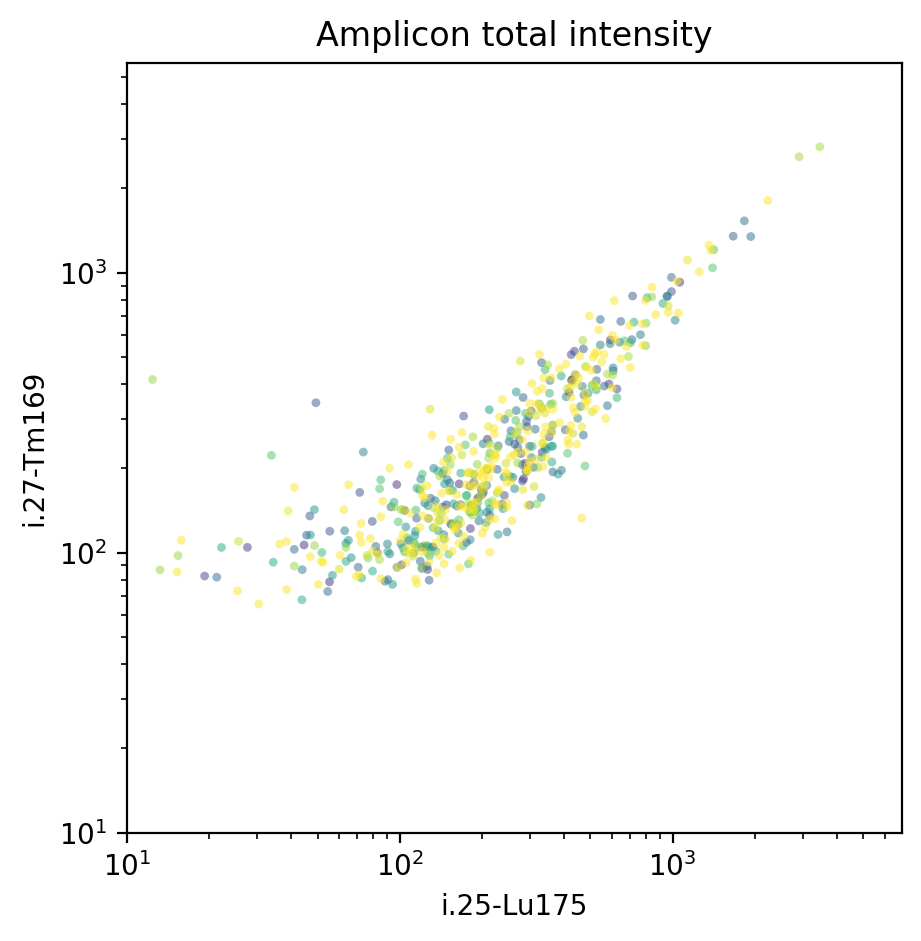

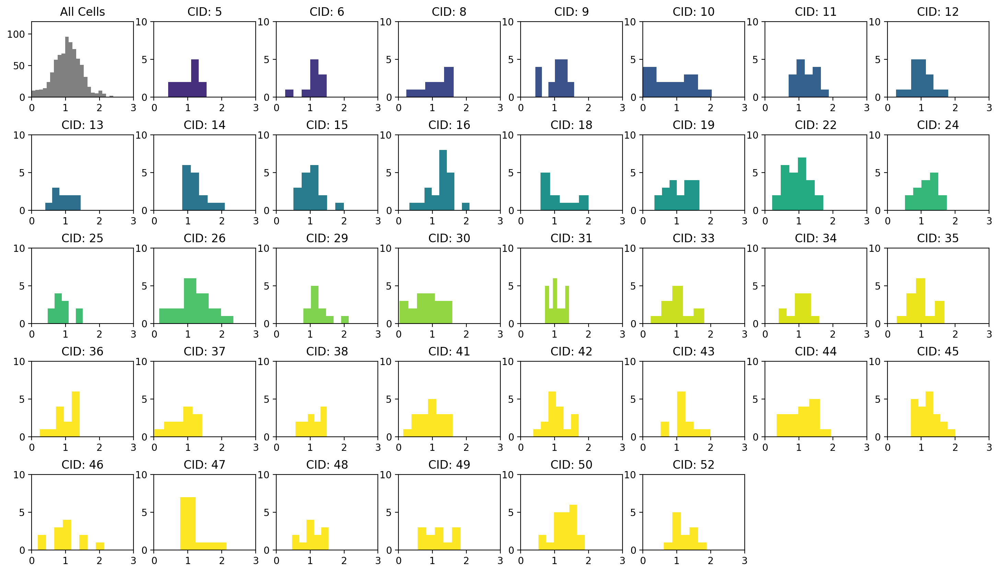

In [99]:
# for each cellpose label, compute the intensity ratio of the amplicon count, plot a histogram
cyto_label_list = cyto_df_filtered['label'].unique()
# define a color map for the number of cellpose labels
cmap = plt.get_cmap('viridis', len(cyto_label_list))
# plot scatter plot of total intensity
plt.figure(figsize=(5,5), dpi = 200)
for cell in cyto_label_list:
    amp_df_cell = amp_df[amp_df['cyto_label'] == cell]
    plt.scatter(amp_df_cell['total_intensity_488'], amp_df_cell['total_intensity_555'], s=40, alpha=0.5, marker='.', edgecolors='none', c=cmap(cell))
plt.xlabel('i.25-Lu175')
plt.ylabel('i.27-Tm169')
plt.title('Amplicon total intensity')

plt.xlim(10, 2*np.max(amp_df['total_intensity_488']))
plt.ylim(10, 2*np.max(amp_df['total_intensity_555']))
# turn on log scale
plt.xscale('log')
plt.yscale('log')
plt.show()

plt.figure(figsize=(18,10), dpi = 200)
# further divide this into more subplo
plt.subplot(len(cyto_label_list+1)//8+1, 8, 1)
plt.hist(amp_df['total_intensity_488']/amp_df['total_intensity_555'], bins='auto', density=False, alpha=1, color='gray')
plt.xlim(0, 3)
plt.ylim(0, 120)
plt.title('All Cells')

count = 2
for cell in cyto_label_list:
    amp_df_cell = amp_df[amp_df['cyto_label'] == cell]
    # plot a smoothened histogram of the intensity ratio
    plt.subplot(len(cyto_label_list+1)//8+1, 8, count)
    plt.hist(amp_df_cell['total_intensity_488']/amp_df_cell['total_intensity_555'], bins='auto', density=False, alpha=1, color=cmap(cell))
    plt.xlim(0, 3)
    plt.ylim(0, 10)
    plt.title('CID: {}'.format(cell))
    count += 1
# set the space between subplots
plt.subplots_adjust(hspace=0.5)
# plt.xlabel('Intensity Ratio (Lu175 / Tm169)')
# plt.ylabel('Density')
# plt.title('Intensity Ratio Distribution')
plt.show()
